In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader
import torchvision.models as models
from torchvision import transforms

import os
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image

from tqdm import tqdm
import time

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

import warnings
warnings.filterwarnings('ignore')

import gc
import argparse
import random
from box import Box
import cv2
import cvlib as cv
# import albumentations
import timm

In [2]:
# seed 고정
def seed_everything(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # if use multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    random.seed(seed)

# 데이터 전처리 함수

In [3]:
# ages 생성
def get_ages(x):
    if x < 30: return 0
    elif x < 60: return 1
    else: return 2

# genders 생성
def get_genders(x):
    if x == 'male': return 0
    else: return 1

# masks 생성
def get_masks(x):
    if x == 'normal': return 2
    elif x == 'incorrect_mask': return 1
    else: return 0

# age_cats 생성
def get_age_cats(x):
    if x < 20: return 0
    elif x < 30: return 1
    elif x < 40: return 2
    elif x < 50: return 3
    elif x < 60: return 4
    else: return 5

# labels 생성
def get_labels(masks, genders, ages):
    return masks * 6 + genders * 3 + ages

# label_cats 생성
def get_label_cats(masks, genders, ages):
    return masks * 12 + genders * 6 + ages

# 마스크 이상치 변경
def swap_mask(swap_li : list, df : pd.DataFrame) -> pd.DataFrame:
    swap_df = df.copy()
    for swap_id in swap_li:
        _swap_df = swap_df[swap_df['id'] == swap_id]
        
        normal_swap_df = _swap_df[_swap_df['mask'] == 'normal']
        incorrect_mask_swap_df = _swap_df[_swap_df['mask'] == 'incorrect_mask']
        
        normal_path = normal_swap_df['path'].values[0]
        incorrect_mask_path = incorrect_mask_swap_df['path'].values[0]
        
        swap_df.loc[normal_swap_df.index, 'path'] = incorrect_mask_path
        swap_df.loc[incorrect_mask_swap_df.index, 'path'] = normal_path
    
    return swap_df

# train_df + mask 결측치 처리
def make_train_df(df : pd.DataFrame, swap_mask_li : list, cfg) -> pd.DataFrame:
    train_df = []
    
    for line in df.iloc:
        for file in list(os.listdir(os.path.join(cfg.train_image_dir, line['path']))):
            if file[0] == '.':
                continue
            
            mask = file.split('.')[0]
            gender = line['gender']
            age = line['age']
            
            masks = get_masks(mask)
            genders = get_genders(gender)
            ages = get_ages(age)
            age_cats = get_age_cats(age)
            
            data = {
                'id' : line['id'],
                'mask' : mask,
                'gender' : gender,
                'age' : age,
                'masks' : masks,
                'genders' : genders,
                'ages' : ages,
                'age_cats' : age_cats,
                'labels': get_labels(masks = masks, genders = genders, ages = ages),
                'label_cats': get_label_cats(masks = masks, genders = genders, ages = age_cats),
                'path': os.path.join(cfg.train_image_dir, line['path'], file),
            }
            
            train_df.append(data)
            
    train_df = pd.DataFrame(train_df)
    
    train_df['idx'] = train_df.index
    train_df['transform'] = 0 # 적용할 transform 선택
    
    train_df = swap_mask(swap_li = swap_mask_li, df = train_df)
    
    return train_df

# 성별 이상치 처리
def swap_gender(swap_li : list, df : pd.DataFrame) -> pd.DataFrame:
    swap_df = df.copy()
    for swap in swap_li:
        swap_id, swap_gender = swap
        swap_df.loc[swap_df[swap_df['id'] == swap_id].index, 'gender'] = swap_gender
    return swap_df

# 사람 나누기 데이터 + 성별 결측치 처리
def preprocessing_df(df : pd.DataFrame, swap_gender_li : list) -> pd.DataFrame:
    
    preprocessing_df = df.copy()
    preprocessing_df = swap_gender(swap_li = swap_gender_li, df = preprocessing_df)
    
    preprocessing_df['ages'] = preprocessing_df['age'].apply(lambda x : get_ages(x))
    preprocessing_df['genders'] = preprocessing_df['gender'].apply(lambda x : get_genders(x))
    
    preprocessing_df['cv_taget_col'] = 'ages' + '_' + preprocessing_df['ages'].astype(str) + '_' + 'genders' + '_' + preprocessing_df['genders'].astype(str)
    
    return preprocessing_df

# 오버샘플링 함수

In [4]:
def transform_setting(train_df, sampling_list, transform_count, target='labels'):
    df = train_df.copy()

    unsampling_df = df[~df[target].isin(sampling_list)]
    unsampling_df.reset_index(drop = True, inplace = True)
    
    row_size = len(unsampling_df)
    
    unsampling_df['transform'] = pd.DataFrame(np.random.randint(0, transform_count, size=(row_size, 1)), columns=['transform'], dtype=np.int64)
       
    return unsampling_df

## 오버 샘플링

def over_sampling(train_df, sampling_list, transform_count, target='labels'):
    df = train_df.copy()
    
    temp_df = df[df[target].isin(sampling_list)] 
    
    sampling_df = pd.DataFrame()
    
    for transform_idx in range(transform_count):
        temp_df['transform'] = transform_idx
        sampling_df = pd.concat([sampling_df, temp_df], ignore_index=True)
    
    sampling_df.reset_index(drop = True, inplace = True)
    
    return sampling_df

# 이상치 시각화 함수

In [5]:
# 이상치 이미지 시각화
def show_img(img_id_li, df, cfg):
    for img_id in img_id_li:
        get_df = df[df['id'] == img_id]
        
        img_age = get_df['age'].tolist()[0]
        img_gender = get_df['gender'].tolist()[0]
        
        img_path = get_df['path'].tolist()[0]
        img_path = os.path.join(cfg.train_image_dir, img_path)
        img_name_li = sorted(list(os.listdir(img_path)))
        
        fig, ax = plt.subplots(1, 7, figsize = (30, 15))
        ax = ax.flatten()
        
        idx = 0
        for _img_name in img_name_li:
            if _img_name[0] == '.': continue
            
            if _img_name.split('.')[0] == 'normal': imag_name = 'normal'
            elif _img_name.split('.')[0] == 'incorrect_mask': imag_name = 'incorrect_mask'
            else: imag_name = 'mask'
            
            get_img_path = os.path.join(img_path, _img_name)
            
            img = Image.open(get_img_path)
            img = np.array(img)
            ax[idx].imshow(img)
            ax[idx].set_title(f'{img_id} / {img_age} / {img_gender} / {imag_name}')
            ax[idx].set_xticks([])
            ax[idx].set_yticks([])
            idx += 1
            
        plt.show()

# image path로 이미지 시각화
def path_li_show_img(path_li):
    fig, ax = plt.subplots(1, 7, figsize = (30, 15))
    ax = ax.flatten()
    idx = 0
    for path in path_li:
        image_name = path.split('/')[-1]
        img = Image.open(path)
        img = np.array(img)
        ax[idx].imshow(img)
        ax[idx].set_title(f'{image_name}')
        ax[idx].set_xticks([])
        ax[idx].set_yticks([])
        idx += 1
    plt.show()

# 데이터 설정 함수

In [6]:
# val_idx 생성
def get_val_idx(df : pd.DataFrame, target_col : str):
    skf = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 22)
    for trn_idx, val_idx in skf.split(df, df[target_col]):
        yield val_idx

class CustomDataset(Dataset):
    def __init__(self, df : pd.DataFrame, cfg, transform_list : list, mode : bool = True):
        self.mode = mode
        self.df = df
        if self.mode:
            self.img_paths = self.df['path'].tolist()
            self.targets = self.df[cfg.tagets_col].tolist()
            self.split_targets = self.df[cfg.split_col].tolist()
            self.transform_idx = self.df['transform'].tolist()
        else:
            self.img_paths = [os.path.join(cfg.submission_image_dir, img_id) for img_id in self.df.ImageID]
        self.transform = transform_list

    def __getitem__(self, index):
        image = Image.open(self.img_paths[index])
        
        if self.transform:
#             image = self.transform(image = np.array(image))['image']
            image = self.transform[0](image)
    
        # 이 부분에 해당 라벨에 따른 데이터 변환 여부 추가
        # val 데이터의 경우 데이터 변환이 일어나면 안되기 때문에
        # if self.데이터 변환해주는 transform:
        #     if self.targets[index].data == labels: <- 확률적으로
        #          image = self.데이터 변환해주는 transform(image)
        # 데이터 변환
        
        if self.mode:
            if self.transform_idx[index] != 0:
                image = self.transform[self.transform_idx[index]](image)
                
            targets = torch.tensor(self.targets[index])
            return image, targets
        
        else: return image

    def __len__(self):
        return len(self.img_paths)

class StratifiedSampler(torch.utils.data.Sampler):
    """Stratified batch sampling
    Provides equal representation of target classes in each batch
    """
    def __init__(self, y, batch_size, shuffle=True):
        if torch.is_tensor(y):
            y = y.cpu().numpy()
        assert len(y.shape) == 1, 'label array must be 1D'
        n_batches = int(len(y) / batch_size)
        self.skf = StratifiedKFold(n_splits = n_batches, shuffle = shuffle)
        self.X = torch.randn(len(y),1).numpy()
        self.y = y
        self.shuffle = shuffle

    def __iter__(self):
        if self.shuffle:
            self.skf.random_state = torch.randint(0,int(1e8),size=()).item()
        for train_idx, test_idx in self.skf.split(self.X, self.y):
            yield test_idx

    def __len__(self):
        return len(self.y)

# 모델

In [7]:
class CreateModel(nn.Module):
    def __init__(self, cfg , pretrained : bool = True):
        super(CreateModel, self).__init__()
        self.model = timm.create_model(cfg.timm_model_name, pretrained = pretrained, num_classes = cfg.num_classes)

    def forward(self, img):
        out = self.model(img)
        return out

In [8]:
def get_f1_score(y_true, y_pred):
    return f1_score(y_true, y_pred, average='macro')

def get_acc_score(y_true, y_pred):
    return accuracy_score(y_true, y_pred)

In [9]:
def model_train(model, optimizer, criterion, data_loader):
    model.train()
    
    train_loss = 0
    real_pred_li = []
    label_pred_li = []
    
    for images, targets in data_loader:
        images, targets = images.to(device), targets.to(device)
        optimizer.zero_grad()
        
        # GA 추가시 아래 부분에 추가하기
        #############################
        
        benign_outputs = model(images)
        loss = criterion(benign_outputs, targets)
        loss.backward()
        
        optimizer.step()
        
        train_loss += loss.item()
        
        predicted = benign_outputs.argmax(dim=-1)
        
        label_pred_li.extend(predicted.detach().cpu().numpy())
        real_pred_li.extend(targets.cpu().numpy())
        
#     label_pred_li = [label_cats2labels[i] for i in label_pred_li]
#     real_pred_li = [label_cats2labels[i] for i in real_pred_li]
    
    train_loss /= len(data_loader)
    train_acc = get_acc_score(y_true = real_pred_li, y_pred = label_pred_li)
    train_fi_score = get_f1_score(y_true = real_pred_li, y_pred = label_pred_li)

    return train_loss, train_acc, train_fi_score

def model_eval(model, criterion, data_loader):
    model.eval()
    
    val_loss = 0
    real_pred_li = []
    label_pred_li = []
    
    with torch.no_grad():
        for images, targets in data_loader:
            images, targets = images.to(device), targets.to(device)

            benign_outputs = model(images)
            loss = criterion(benign_outputs, targets)

            val_loss += loss.item()

            predicted = benign_outputs.argmax(dim=-1)
        
            label_pred_li.extend(predicted.cpu().numpy())
            real_pred_li.extend(targets.cpu().numpy())
    
#     label_pred_li = [label_cats2labels[i] for i in label_pred_li]
#     real_pred_li = [label_cats2labels[i] for i in real_pred_li]
    
    val_loss /= len(data_loader)
    val_acc = get_acc_score(y_true = real_pred_li, y_pred = label_pred_li)
    val_fi_score = get_f1_score(y_true = real_pred_li, y_pred = label_pred_li)
   
    return val_loss, val_acc, val_fi_score

In [10]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

In [11]:
def get_val_pred_li(model, data_loader):
    model.eval()
    real_pred_li = []
    label_pred_li = []
    ensemble_pred_li = []
    
    with torch.no_grad():
        for images, targets in data_loader:
            images = images.to(device)
            output = model(images)
            
            label = output.argmax(dim=-1)
            label_pred_li.extend(label.cpu().numpy())
            
            ensemble_label = output.softmax(1)
            ensemble_pred_li.append(ensemble_label.cpu().numpy())
            
            real_pred_li.extend(targets.cpu().numpy())
            
#     label_pred_li = [label_cats2labels[i] for i in label_pred_li]
#     real_pred_li = [label_cats2labels[i] for i in real_pred_li]
    
    return label_pred_li, np.concatenate(ensemble_pred_li), real_pred_li

def get_submission_pred_li(model, data_loader):
    model.eval()
    label_pred_li = []
    ensemble_pred_li = []
    
    with torch.no_grad():
        for images in data_loader:
            images = images.to(device)
            output = model(images)
            
            label = output.argmax(dim=-1)
            label_pred_li.extend(label.cpu().numpy())
            
            ensemble_label = output.softmax(1)
            ensemble_pred_li.append(ensemble_label.cpu().numpy())
            
#     label_pred_li = [label_cats2labels[i] for i in label_pred_li]
    
    return label_pred_li, np.concatenate(ensemble_pred_li)

In [12]:
class FocalLoss(nn.Module):
    def __init__(self, weight=None, gamma=2., reduction='mean'):
        nn.Module.__init__(self)
        self.weight = weight
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, input_tensor, target_tensor):
        log_prob = F.log_softmax(input_tensor, dim=-1)
        prob = torch.exp(log_prob)
        return F.nll_loss(
            ((1 - prob) ** self.gamma) * log_prob,
            target_tensor,
            weight=self.weight,
            reduction=self.reduction
        )


class LabelSmoothingLoss(nn.Module):
    def __init__(self, classes=3, smoothing=0.0, dim=-1):
        super(LabelSmoothingLoss, self).__init__()
        self.confidence = 1.0 - smoothing
        self.smoothing = smoothing
        self.cls = classes
        self.dim = dim

    def forward(self, pred, target):
        pred = pred.log_softmax(dim=self.dim)
        with torch.no_grad():
            true_dist = torch.zeros_like(pred)
            true_dist.fill_(self.smoothing / (self.cls - 1))
            true_dist.scatter_(1, target.data.unsqueeze(1), self.confidence)
        return torch.mean(torch.sum(-true_dist * pred, dim=self.dim))


# https://gist.github.com/SuperShinyEyes/dcc68a08ff8b615442e3bc6a9b55a354
class F1Loss(nn.Module):
    def __init__(self, classes=3, epsilon=1e-7):
        super().__init__()
        self.classes = classes
        self.epsilon = epsilon

    def forward(self, y_pred, y_true):
        assert y_pred.ndim == 2
        assert y_true.ndim == 1
        y_true = F.one_hot(y_true, self.classes).to(torch.float32)
        y_pred = F.softmax(y_pred, dim=1)

        tp = (y_true * y_pred).sum(dim=0).to(torch.float32)
        tn = ((1 - y_true) * (1 - y_pred)).sum(dim=0).to(torch.float32)
        fp = ((1 - y_true) * y_pred).sum(dim=0).to(torch.float32)
        fn = (y_true * (1 - y_pred)).sum(dim=0).to(torch.float32)

        precision = tp / (tp + fp + self.epsilon)
        recall = tp / (tp + fn + self.epsilon)

        f1 = 2 * (precision * recall) / (precision + recall + self.epsilon)
        f1 = f1.clamp(min=self.epsilon, max=1 - self.epsilon)
        return 1 - f1.mean()

# 환경 설정

In [13]:
# 이상치 list
# swap_gender_li = ['id', '바꿀 성별']
# swap_mask_li = ['id']
swap_gender_li = [['006359', 'male'], ['006360', 'male'], ['006361', 'male'], ['006362', 'male'], 
                  ['006363', 'male'], ['006364', 'male'], ['001498-1', 'female'], ['004432', 'female']]
swap_mask_li = ['000020', '004418', '005227']

config = {
    'seed' : 22,
    
    'image_size' : [512, 384],
    'image_normal_mean' : [0.485, 0.456, 0.406],
    'image_normal_std' : [0.229, 0.224, 0.225],
    
    # oversampling
    'sampling_list' : [2, 5, 8, 11, 14, 17],
    
    'crop_size' : 384,
    'blur_kernel_size' : 19,
    'brightness' : 0.8,
    'rotation' : 10,
    
    'num_workers' : 3,
    'epochs' : 20,
    'batch_size' : 128,
    'lr' : 0.001,
    'oof' : 5,
    'num_classes' : 18,
    
#     cel
#     labelsmoothing
#     focal
#     f1
    'loss' : 'labelsmoothing',
    'smoothing' : 0.1,
    
    'train_data_name' : 'train.csv',
    'train_data_dir' : '/opt/ml/input/data/train',
    'train_image_dir' : '/opt/ml/input/data/train/images',
    
    'submission_data_name' : 'info.csv',
    'submission_data_dir' : '/opt/ml/input/data/eval',
    'submission_image_dir' : '/opt/ml/input/data/eval/images',
    'submission_dir' : './submission',
    
    
    'model_dir' : './model',
    # 저장할 모델병
    'model_name' : 'regnety_002_labels_gray_485_456_406_oversampling',
    
    # timm 에 존재하는 모델 이름
    'timm_model_name' : 'regnety_002',
    
    # 학습 타겟
    'tagets_col' : 'labels',
    'split_col' : 'label_cats',
    'cv_taget_col' : 'cv_taget_col',
    
    # 저장할 파일명
    'file_name' : 'regnety_002_labels_gray_485_456_406_oversampling.csv',
}

device = 'cuda' if torch.cuda.is_available() else 'cpu'

config = Box(config)

In [14]:
# 변환할 transform
# from albumentations import *
# from albumentations.pytorch import ToTensorV2

def image_face_crop(image, **kwargs):
    face, confidence = cv.detect_face(image)
    if not face : return image
    x, y, w, h = face[0]
    H, W, C = image.shape
    image = image[max(y - 100, 0) : min(h + 100, H), max(0 , x - 100) : min(w + 100, W)]
    return image

# 적용할 transform 목록 정의
transform_list = [
    transforms.Compose([
#     Resize(image_size, Image.BILINEAR),
    transforms.ToTensor(),
    transforms.CenterCrop(config.crop_size),
    transforms.Normalize(mean=config.image_normal_mean, std=config.image_normal_std),
    transforms.Grayscale(num_output_channels=3),
]),
    
    transforms.Compose([
    transforms.GaussianBlur(config.blur_kernel_size),
]),
        
    transforms.Compose([
    transforms.ColorJitter(brightness = config.brightness),
]),
    
    transforms.Compose([
    transforms.RandomRotation(config.rotation),
]),
             
]

# transform = {
#         "train": transforms.Compose(
#             [
# #                 Lambda(image_face_crop),
# #                 ToPILImage(),
#                 Resize(config.image_size, Image.BILINEAR),
#                 ToTensor(),
# #                 RandomHorizontalFlip(p = 0.5),
#                 Normalize(mean=config.image_normal_mean, std=config.image_normal_std),
#             ]
#         ),  
#         "val": transforms.Compose(
#             [
#                 Resize(config.image_size, Image.BILINEAR),
#                 ToTensor(),
#                 Normalize(mean=config.image_normal_mean, std=config.image_normal_std),
#             ]
#         ),
#     }

# transform 개수
transform_count = len(transform_list)


# 데이터 로드

In [15]:
seed_everything(config.seed)

In [16]:
df = pd.read_csv(os.path.join(config.train_data_dir, config.train_data_name))
submission = pd.read_csv(os.path.join(config.submission_data_dir, config.submission_data_name))

# 이상치 시각화

In [17]:
# show_img(img_id_li =['000020', '004418', '005227', '006359', '006360', '006361', '006362', '006363', '006364', '001498-1'], df = df, cfg = config)

# 학습

In [18]:
pre_df = preprocessing_df(df = df, swap_gender_li = swap_gender_li)
train_df = make_train_df(df = pre_df, swap_mask_li = swap_mask_li, cfg = config)

all_idx_li = pre_df.index.tolist()
val_idx_li = get_val_idx(df = pre_df, target_col = config.cv_taget_col)

total_start_time = time.time()

for fold_num in range(1, config.oof + 1):
    fold_start_time = time.time()
    
    # trn, val 데이터 셋
    val_idx = next(val_idx_li)
    trn_idx = list(set(all_idx_li) - set(val_idx.tolist()))
    
    val_id_df = pre_df.iloc[val_idx, :]
    trn_id_df = pre_df.iloc[trn_idx, :]
    
    val_df = train_df.set_index('id').loc[val_id_df['id'].tolist(), :].reset_index()
    trn_df = train_df.set_index('id').loc[trn_id_df['id'].tolist(), :].reset_index()
    
    # 이 부분에 클래스가 적은 데이터 증강 함수 추가
    ########################################3
    
    unsampling_set = transform_setting(trn_df, sampling_list = config.sampling_list, 
                                       transform_count = transform_count, target = config.tagets_col)

    sampling_set = over_sampling(trn_df, sampling_list = config.sampling_list, 
                                 transform_count = transform_count, target = config.tagets_col)

    trn_df = pd.concat([unsampling_set, sampling_set], ignore_index=True)
    
    # 배치 단위 데이터 생성 부분
    #########################
    
    
    # dataset 구축
    trn_dataset = CustomDataset(df = trn_df,
                                cfg = config,
                                transform_list = transform_list,
                                mode = True,
                               )
    
    train_loder = DataLoader(trn_dataset,
                           batch_size = config.batch_size,
                           num_workers = config.num_workers,
                           shuffle = True,
                            )
    
    
#     sampler = StratifiedSampler(y = np.array(trn_dataset.split_targets), 
#                                 batch_size = config.batch_size, 
#                                 shuffle = True)
    
#     train_loder = DataLoader(trn_dataset,
#                              num_workers = config.num_workers,
#                              batch_sampler = sampler)
    
    
    val_dataset = CustomDataset(df = val_df,
                                cfg = config,
                                transform_list = transform_list,
                                mode = True,)
    
    val_loder = DataLoader(val_dataset,
                           batch_size = config.batch_size,
                           num_workers = config.num_workers,
                           shuffle = False,)
    
    # 모델 정의
    model = CreateModel(cfg = config, pretrained = True).to(device)

    # loss 설정
    if config.loss == 'cel':
        criterion = nn.CrossEntropyLoss()
    elif config.loss == 'labelsmoothing':
        criterion = LabelSmoothingLoss(classes=config.num_classes, smoothing = config.smoothing, dim=-1)
    elif config.loss == 'focal':
        criterion = FocalLoss(weight=None, gamma=2., reduction='mean')
    elif config.loss == 'f1':
        criterion = F1Loss(classes=config.num_classes, epsilon=1e-7)
    else:
        print('not loss')
    
    # optimizer 설정
    optimizer = torch.optim.Adam(model.parameters(), lr=config.lr)
    
    # scheduler 설정
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor = 0.1, eps = 1e-09, patience = 5)
   
    # besf_metric 설정
    min_val_loss = float("inf")
    early_stopping_count = 0
    
    for epoch in tqdm(range(1, config.epochs + 1)):
        epoch_start_time = time.time()
        
        train_loss, train_acc, train_fi_score = model_train(model = model, 
                                                            optimizer = optimizer, 
                                                            criterion = criterion, 
                                                            data_loader = train_loder)
        
        val_loss, val_acc, val_fi_score, = model_eval(model = model,
                                                      criterion = criterion,
                                                      data_loader = val_loder)
        
        # 학습률
        now_lr = get_lr(optimizer = optimizer)
        
        epoch_end_time = time.time()
        
        print(f'''{fold_num}fold, epoch: {epoch}, lr: {now_lr}, train_loss: {train_loss:.4f}, train_acc: {train_acc:.4f}, train_f1: {train_fi_score:.4f}, val_loss: {val_loss:.4f}, val_acc: {val_acc:.4f}, val_fi: {val_fi_score:.4f}, 학습시간: {epoch_end_time - epoch_start_time} \n''')

        # 스케줄러
        scheduler.step(val_loss)
        
        # 모델 저장
        if val_loss < min_val_loss:
            min_val_loss = val_loss
            torch.save(model.state_dict(), os.path.join(config.model_dir, f'{fold_num}fold_{config.model_name}.pt'))
            print(val_loss, '모델 저장')
            early_stopping_count = 0
        else:
            early_stopping_count += 1
            if early_stopping_count == 10:
                print('early_stopping')
                break
            
        # 모델 저장
#         if besf_fi < val_loss:
#             besf_fi = val_fi_score
#             torch.save(model.state_dict(), os.path.join(config.model_dir, f'{fold_num}fold_{config.model_name}.pt'))
#             print(besf_fi, '모델 저장')
    
    fold_end_time = time.time()
    
    print(f'{fold_num}fold 훈련 시간: {fold_end_time - fold_start_time} \n')
    
    # 메모리 정리
    gc.collect()
    torch.cuda.empty_cache()

total_end_time = time.time()
print(f'총 훈련 시간: {total_end_time - total_start_time}')

  5%|▌         | 1/20 [04:01<1:16:21, 241.15s/it]

1fold, epoch: 1, lr: 0.001, train_loss: 1.1486, train_acc: 0.7851, train_f1: 0.7317, val_loss: 1.0166, val_acc: 0.8444, val_fi: 0.6771, 학습시간: 241.10232377052307 

1.0165874739487966 모델 저장


 10%|█         | 2/20 [08:03<1:12:24, 241.38s/it]

1fold, epoch: 2, lr: 0.001, train_loss: 0.7924, train_acc: 0.9284, train_f1: 0.9134, val_loss: 1.0929, val_acc: 0.8307, val_fi: 0.5957, 학습시간: 241.90678644180298 



 15%|█▌        | 3/20 [12:00<1:08:02, 240.16s/it]

1fold, epoch: 3, lr: 0.001, train_loss: 0.7254, train_acc: 0.9570, train_f1: 0.9491, val_loss: 1.0744, val_acc: 0.8320, val_fi: 0.6839, 학습시간: 237.3068823814392 



 20%|██        | 4/20 [16:00<1:04:02, 240.16s/it]

1fold, epoch: 4, lr: 0.001, train_loss: 0.6989, train_acc: 0.9681, train_f1: 0.9599, val_loss: 1.0730, val_acc: 0.8487, val_fi: 0.7015, 학습시간: 240.17512249946594 



 25%|██▌       | 5/20 [20:06<1:00:26, 241.77s/it]

1fold, epoch: 5, lr: 0.001, train_loss: 0.6783, train_acc: 0.9759, train_f1: 0.9711, val_loss: 0.9822, val_acc: 0.8743, val_fi: 0.7332, 학습시간: 245.42116332054138 

0.9821798245112101 모델 저장


 30%|███       | 6/20 [24:13<56:47, 243.41s/it]  

1fold, epoch: 6, lr: 0.001, train_loss: 0.6710, train_acc: 0.9772, train_f1: 0.9753, val_loss: 1.0018, val_acc: 0.8690, val_fi: 0.7442, 학습시간: 247.24365282058716 



 35%|███▌      | 7/20 [28:14<52:37, 242.86s/it]

1fold, epoch: 7, lr: 0.001, train_loss: 0.6566, train_acc: 0.9839, train_f1: 0.9812, val_loss: 1.0004, val_acc: 0.8754, val_fi: 0.7630, 학습시간: 241.581228017807 



 40%|████      | 8/20 [32:21<48:48, 244.08s/it]

1fold, epoch: 8, lr: 0.001, train_loss: 0.6561, train_acc: 0.9837, train_f1: 0.9804, val_loss: 1.0687, val_acc: 0.8458, val_fi: 0.7312, 학습시간: 246.90855073928833 



 45%|████▌     | 9/20 [36:27<44:51, 244.66s/it]

1fold, epoch: 9, lr: 0.001, train_loss: 0.6567, train_acc: 0.9824, train_f1: 0.9821, val_loss: 1.0530, val_acc: 0.8646, val_fi: 0.7292, 학습시간: 246.02981734275818 



 50%|█████     | 10/20 [40:42<41:15, 247.59s/it]

1fold, epoch: 10, lr: 0.001, train_loss: 0.6531, train_acc: 0.9842, train_f1: 0.9804, val_loss: 1.0786, val_acc: 0.8508, val_fi: 0.7374, 학습시간: 254.41295170783997 



 55%|█████▌    | 11/20 [44:43<36:51, 245.69s/it]

1fold, epoch: 11, lr: 0.001, train_loss: 0.6410, train_acc: 0.9897, train_f1: 0.9878, val_loss: 1.0257, val_acc: 0.8714, val_fi: 0.7365, 학습시간: 241.26747107505798 



 60%|██████    | 12/20 [48:41<32:26, 243.26s/it]

1fold, epoch: 12, lr: 0.0001, train_loss: 0.6211, train_acc: 0.9963, train_f1: 0.9961, val_loss: 0.9870, val_acc: 0.8799, val_fi: 0.7648, 학습시간: 237.58654236793518 



 65%|██████▌   | 13/20 [52:44<28:23, 243.35s/it]

1fold, epoch: 13, lr: 0.0001, train_loss: 0.6158, train_acc: 0.9986, train_f1: 0.9984, val_loss: 0.9816, val_acc: 0.8799, val_fi: 0.7511, 학습시간: 243.45818710327148 

0.9815603335698445 모델 저장


 70%|███████   | 14/20 [56:56<24:35, 245.98s/it]

1fold, epoch: 14, lr: 0.0001, train_loss: 0.6141, train_acc: 0.9990, train_f1: 0.9989, val_loss: 0.9870, val_acc: 0.8804, val_fi: 0.7528, 학습시간: 252.10915279388428 



 75%|███████▌  | 15/20 [1:01:03<20:31, 246.22s/it]

1fold, epoch: 15, lr: 0.0001, train_loss: 0.6125, train_acc: 0.9996, train_f1: 0.9996, val_loss: 0.9821, val_acc: 0.8817, val_fi: 0.7505, 학습시간: 246.8010654449463 



 80%|████████  | 16/20 [1:05:09<16:24, 246.03s/it]

1fold, epoch: 16, lr: 0.0001, train_loss: 0.6122, train_acc: 0.9996, train_f1: 0.9994, val_loss: 0.9849, val_acc: 0.8815, val_fi: 0.7512, 학습시간: 245.57236194610596 



 85%|████████▌ | 17/20 [1:09:18<12:21, 247.03s/it]

1fold, epoch: 17, lr: 0.0001, train_loss: 0.6120, train_acc: 0.9997, train_f1: 0.9995, val_loss: 0.9976, val_acc: 0.8775, val_fi: 0.7489, 학습시간: 249.37823796272278 



 90%|█████████ | 18/20 [1:13:11<08:05, 242.87s/it]

1fold, epoch: 18, lr: 0.0001, train_loss: 0.6118, train_acc: 0.9997, train_f1: 0.9997, val_loss: 0.9951, val_acc: 0.8788, val_fi: 0.7483, 학습시간: 233.16098999977112 



 95%|█████████▌| 19/20 [1:17:09<04:01, 241.36s/it]

1fold, epoch: 19, lr: 0.0001, train_loss: 0.6117, train_acc: 0.9996, train_f1: 0.9995, val_loss: 0.9939, val_acc: 0.8804, val_fi: 0.7460, 학습시간: 237.8443307876587 



100%|██████████| 20/20 [1:21:20<00:00, 244.01s/it]

1fold, epoch: 20, lr: 1e-05, train_loss: 0.6115, train_acc: 0.9997, train_f1: 0.9995, val_loss: 0.9900, val_acc: 0.8788, val_fi: 0.7401, 학습시간: 250.74200081825256 

1fold 훈련 시간: 4884.852902889252 




  5%|▌         | 1/20 [04:11<1:19:38, 251.48s/it]

2fold, epoch: 1, lr: 0.001, train_loss: 1.1531, train_acc: 0.7849, train_f1: 0.7316, val_loss: 0.9410, val_acc: 0.8696, val_fi: 0.7838, 학습시간: 251.43835353851318 

0.940952601035436 모델 저장


 10%|█         | 2/20 [08:22<1:15:26, 251.46s/it]

2fold, epoch: 2, lr: 0.001, train_loss: 0.8001, train_acc: 0.9286, train_f1: 0.9173, val_loss: 1.0150, val_acc: 0.8392, val_fi: 0.7613, 학습시간: 251.40877509117126 



 15%|█▌        | 3/20 [12:37<1:11:30, 252.36s/it]

2fold, epoch: 3, lr: 0.001, train_loss: 0.7198, train_acc: 0.9615, train_f1: 0.9556, val_loss: 0.9494, val_acc: 0.8706, val_fi: 0.8050, 학습시간: 254.46492719650269 



 20%|██        | 4/20 [16:54<1:07:39, 253.71s/it]

2fold, epoch: 4, lr: 0.001, train_loss: 0.6926, train_acc: 0.9700, train_f1: 0.9628, val_loss: 1.0913, val_acc: 0.8418, val_fi: 0.6945, 학습시간: 256.8592035770416 



 25%|██▌       | 5/20 [20:59<1:02:48, 251.21s/it]

2fold, epoch: 5, lr: 0.001, train_loss: 0.6808, train_acc: 0.9742, train_f1: 0.9703, val_loss: 1.0388, val_acc: 0.8505, val_fi: 0.7679, 학습시간: 245.35358047485352 



 30%|███       | 6/20 [25:07<58:23, 250.22s/it]  

2fold, epoch: 6, lr: 0.001, train_loss: 0.6733, train_acc: 0.9759, train_f1: 0.9731, val_loss: 0.9579, val_acc: 0.8828, val_fi: 0.7987, 학습시간: 247.9210262298584 



 35%|███▌      | 7/20 [29:14<54:01, 249.35s/it]

2fold, epoch: 7, lr: 0.001, train_loss: 0.6642, train_acc: 0.9808, train_f1: 0.9765, val_loss: 1.0966, val_acc: 0.8272, val_fi: 0.7771, 학습시간: 247.31179928779602 



 40%|████      | 8/20 [33:24<49:53, 249.45s/it]

2fold, epoch: 8, lr: 0.0001, train_loss: 0.6291, train_acc: 0.9931, train_f1: 0.9929, val_loss: 0.8865, val_acc: 0.9029, val_fi: 0.8348, 학습시간: 249.59248566627502 

0.8865236024061839 모델 저장


 45%|████▌     | 9/20 [37:34<45:44, 249.54s/it]

2fold, epoch: 9, lr: 0.0001, train_loss: 0.6183, train_acc: 0.9980, train_f1: 0.9976, val_loss: 0.8984, val_acc: 0.8984, val_fi: 0.8284, 학습시간: 249.76708889007568 



 50%|█████     | 10/20 [41:41<41:29, 248.92s/it]

2fold, epoch: 10, lr: 0.0001, train_loss: 0.6155, train_acc: 0.9989, train_f1: 0.9986, val_loss: 0.8911, val_acc: 0.9040, val_fi: 0.8337, 학습시간: 247.44772148132324 



 55%|█████▌    | 11/20 [45:51<37:22, 249.14s/it]

2fold, epoch: 11, lr: 0.0001, train_loss: 0.6148, train_acc: 0.9989, train_f1: 0.9987, val_loss: 0.8923, val_acc: 0.9013, val_fi: 0.8320, 학습시간: 249.65496063232422 



 60%|██████    | 12/20 [49:52<32:53, 246.75s/it]

2fold, epoch: 12, lr: 0.0001, train_loss: 0.6134, train_acc: 0.9995, train_f1: 0.9997, val_loss: 0.8920, val_acc: 0.9029, val_fi: 0.8256, 학습시간: 241.16999530792236 



 65%|██████▌   | 13/20 [54:03<28:56, 248.12s/it]

2fold, epoch: 13, lr: 0.0001, train_loss: 0.6136, train_acc: 0.9992, train_f1: 0.9990, val_loss: 0.8984, val_acc: 0.9032, val_fi: 0.8249, 학습시간: 251.33312368392944 



 70%|███████   | 14/20 [58:05<24:37, 246.30s/it]

2fold, epoch: 14, lr: 0.0001, train_loss: 0.6130, train_acc: 0.9994, train_f1: 0.9992, val_loss: 0.8966, val_acc: 0.9048, val_fi: 0.8322, 학습시간: 242.04155445098877 



 75%|███████▌  | 15/20 [1:02:13<20:32, 246.58s/it]

2fold, epoch: 15, lr: 1e-05, train_loss: 0.6124, train_acc: 0.9997, train_f1: 0.9997, val_loss: 0.8974, val_acc: 0.9029, val_fi: 0.8324, 학습시간: 247.21501183509827 



 80%|████████  | 16/20 [1:06:16<16:22, 245.61s/it]

2fold, epoch: 16, lr: 1e-05, train_loss: 0.6125, train_acc: 0.9995, train_f1: 0.9994, val_loss: 0.8988, val_acc: 0.9042, val_fi: 0.8343, 학습시간: 243.36865377426147 



 85%|████████▌ | 17/20 [1:10:25<12:20, 246.72s/it]

2fold, epoch: 17, lr: 1e-05, train_loss: 0.6129, train_acc: 0.9995, train_f1: 0.9991, val_loss: 0.8955, val_acc: 0.9045, val_fi: 0.8385, 학습시간: 249.3128170967102 



 85%|████████▌ | 17/20 [1:14:32<13:09, 263.06s/it]

2fold, epoch: 18, lr: 1e-05, train_loss: 0.6121, train_acc: 0.9997, train_f1: 0.9997, val_loss: 0.8964, val_acc: 0.9063, val_fi: 0.8356, 학습시간: 246.28614783287048 

early_stopping
2fold 훈련 시간: 4472.313983440399 




  5%|▌         | 1/20 [04:03<1:17:01, 243.22s/it]

3fold, epoch: 1, lr: 0.001, train_loss: 1.1452, train_acc: 0.7856, train_f1: 0.7288, val_loss: 0.9780, val_acc: 0.8630, val_fi: 0.7219, 학습시간: 243.1694097518921 

0.978015128771464 모델 저장


 10%|█         | 2/20 [08:04<1:12:47, 242.61s/it]

3fold, epoch: 2, lr: 0.001, train_loss: 0.7980, train_acc: 0.9266, train_f1: 0.9144, val_loss: 1.1434, val_acc: 0.7866, val_fi: 0.6897, 학습시간: 241.20262813568115 



 15%|█▌        | 3/20 [12:11<1:09:09, 244.10s/it]

3fold, epoch: 3, lr: 0.001, train_loss: 0.7252, train_acc: 0.9576, train_f1: 0.9500, val_loss: 0.9351, val_acc: 0.8867, val_fi: 0.7837, 학습시간: 247.48957419395447 

0.9351032813390096 모델 저장


 20%|██        | 4/20 [16:13<1:04:51, 243.21s/it]

3fold, epoch: 4, lr: 0.001, train_loss: 0.7029, train_acc: 0.9659, train_f1: 0.9599, val_loss: 0.9225, val_acc: 0.8878, val_fi: 0.7922, 학습시간: 241.0629346370697 

0.9224752326806386 모델 저장


 25%|██▌       | 5/20 [20:18<1:00:55, 243.72s/it]

3fold, epoch: 5, lr: 0.001, train_loss: 0.6843, train_acc: 0.9734, train_f1: 0.9681, val_loss: 0.8986, val_acc: 0.9010, val_fi: 0.8328, 학습시간: 244.8051221370697 

0.8985868215560913 모델 저장


 30%|███       | 6/20 [24:22<56:56, 244.06s/it]  

3fold, epoch: 6, lr: 0.001, train_loss: 0.6701, train_acc: 0.9782, train_f1: 0.9755, val_loss: 1.0903, val_acc: 0.8292, val_fi: 0.7620, 학습시간: 244.86075806617737 



 35%|███▌      | 7/20 [28:21<52:29, 242.30s/it]

3fold, epoch: 7, lr: 0.001, train_loss: 0.6681, train_acc: 0.9787, train_f1: 0.9764, val_loss: 0.9855, val_acc: 0.8740, val_fi: 0.7861, 학습시간: 238.19176816940308 



 40%|████      | 8/20 [32:27<48:43, 243.62s/it]

3fold, epoch: 8, lr: 0.001, train_loss: 0.6547, train_acc: 0.9842, train_f1: 0.9789, val_loss: 1.0570, val_acc: 0.8410, val_fi: 0.7573, 학습시간: 246.69675278663635 



 45%|████▌     | 9/20 [36:31<44:41, 243.76s/it]

3fold, epoch: 9, lr: 0.001, train_loss: 0.6534, train_acc: 0.9842, train_f1: 0.9833, val_loss: 0.9328, val_acc: 0.8846, val_fi: 0.7780, 학습시간: 244.08311533927917 



 50%|█████     | 10/20 [40:32<40:29, 242.91s/it]

3fold, epoch: 10, lr: 0.001, train_loss: 0.6529, train_acc: 0.9835, train_f1: 0.9812, val_loss: 0.9484, val_acc: 0.8817, val_fi: 0.7948, 학습시간: 240.9329514503479 



 55%|█████▌    | 11/20 [44:39<36:37, 244.17s/it]

3fold, epoch: 11, lr: 0.001, train_loss: 0.6529, train_acc: 0.9843, train_f1: 0.9813, val_loss: 0.9205, val_acc: 0.8883, val_fi: 0.7833, 학습시간: 247.091863155365 



 60%|██████    | 12/20 [48:42<32:30, 243.75s/it]

3fold, epoch: 12, lr: 0.0001, train_loss: 0.6268, train_acc: 0.9943, train_f1: 0.9933, val_loss: 0.8563, val_acc: 0.9213, val_fi: 0.8244, 학습시간: 242.7071590423584 

0.8562969485918681 모델 저장


 65%|██████▌   | 13/20 [52:52<28:38, 245.50s/it]

3fold, epoch: 13, lr: 0.0001, train_loss: 0.6158, train_acc: 0.9989, train_f1: 0.9985, val_loss: 0.8612, val_acc: 0.9208, val_fi: 0.8097, 학습시간: 249.57925820350647 



 70%|███████   | 14/20 [56:55<24:28, 244.80s/it]

3fold, epoch: 14, lr: 0.0001, train_loss: 0.6147, train_acc: 0.9989, train_f1: 0.9985, val_loss: 0.8629, val_acc: 0.9226, val_fi: 0.8198, 학습시간: 243.15714478492737 



 75%|███████▌  | 15/20 [1:00:55<20:17, 243.47s/it]

3fold, epoch: 15, lr: 0.0001, train_loss: 0.6138, train_acc: 0.9990, train_f1: 0.9989, val_loss: 0.8612, val_acc: 0.9232, val_fi: 0.8217, 학습시간: 240.35417532920837 



 80%|████████  | 16/20 [1:04:48<16:00, 240.13s/it]

3fold, epoch: 16, lr: 0.0001, train_loss: 0.6133, train_acc: 0.9993, train_f1: 0.9991, val_loss: 0.8657, val_acc: 0.9229, val_fi: 0.8234, 학습시간: 232.33212614059448 



 85%|████████▌ | 17/20 [1:08:56<12:07, 242.62s/it]

3fold, epoch: 17, lr: 0.0001, train_loss: 0.6125, train_acc: 0.9997, train_f1: 0.9997, val_loss: 0.8633, val_acc: 0.9218, val_fi: 0.8224, 학습시간: 248.43949174880981 



 90%|█████████ | 18/20 [1:12:52<08:00, 240.49s/it]

3fold, epoch: 18, lr: 0.0001, train_loss: 0.6126, train_acc: 0.9995, train_f1: 0.9995, val_loss: 0.8623, val_acc: 0.9226, val_fi: 0.8227, 학습시간: 235.5098295211792 



 95%|█████████▌| 19/20 [1:16:53<04:00, 240.70s/it]

3fold, epoch: 19, lr: 1e-05, train_loss: 0.6117, train_acc: 0.9997, train_f1: 0.9996, val_loss: 0.8615, val_acc: 0.9224, val_fi: 0.8223, 학습시간: 241.2050428390503 



100%|██████████| 20/20 [1:20:59<00:00, 242.95s/it]

3fold, epoch: 20, lr: 1e-05, train_loss: 0.6120, train_acc: 0.9997, train_f1: 0.9997, val_loss: 0.8649, val_acc: 0.9210, val_fi: 0.8193, 학습시간: 245.79853677749634 

3fold 훈련 시간: 4859.283339977264 




  5%|▌         | 1/20 [04:06<1:18:06, 246.68s/it]

4fold, epoch: 1, lr: 0.001, train_loss: 1.1587, train_acc: 0.7799, train_f1: 0.7278, val_loss: 1.1035, val_acc: 0.7893, val_fi: 0.7098, 학습시간: 246.635596036911 

1.1035380403200785 모델 저장


 10%|█         | 2/20 [08:08<1:13:36, 245.34s/it]

4fold, epoch: 2, lr: 0.001, train_loss: 0.7934, train_acc: 0.9308, train_f1: 0.9164, val_loss: 1.0243, val_acc: 0.8416, val_fi: 0.7055, 학습시간: 242.1379270553589 

1.0242533067862192 모델 저장


 15%|█▌        | 3/20 [12:13<1:09:25, 245.05s/it]

4fold, epoch: 3, lr: 0.001, train_loss: 0.7271, train_acc: 0.9572, train_f1: 0.9493, val_loss: 0.9324, val_acc: 0.8820, val_fi: 0.7868, 학습시간: 244.27469682693481 

0.9323561330636342 모델 저장


 20%|██        | 4/20 [16:20<1:05:29, 245.62s/it]

4fold, epoch: 4, lr: 0.001, train_loss: 0.6969, train_acc: 0.9671, train_f1: 0.9617, val_loss: 1.0114, val_acc: 0.8635, val_fi: 0.7759, 학습시간: 246.94836020469666 



 25%|██▌       | 5/20 [20:24<1:01:16, 245.08s/it]

4fold, epoch: 5, lr: 0.001, train_loss: 0.6852, train_acc: 0.9733, train_f1: 0.9677, val_loss: 0.8998, val_acc: 0.8960, val_fi: 0.7911, 학습시간: 243.7472949028015 

0.8997801303863525 모델 저장


 30%|███       | 6/20 [24:31<57:20, 245.73s/it]  

4fold, epoch: 6, lr: 0.001, train_loss: 0.6690, train_acc: 0.9780, train_f1: 0.9759, val_loss: 0.9160, val_acc: 0.8957, val_fi: 0.7794, 학습시간: 247.2525680065155 



 35%|███▌      | 7/20 [28:32<52:57, 244.43s/it]

4fold, epoch: 7, lr: 0.001, train_loss: 0.6626, train_acc: 0.9814, train_f1: 0.9798, val_loss: 0.9955, val_acc: 0.8711, val_fi: 0.7907, 학습시간: 241.37495803833008 



 40%|████      | 8/20 [32:37<48:54, 244.52s/it]

4fold, epoch: 8, lr: 0.001, train_loss: 0.6585, train_acc: 0.9817, train_f1: 0.9777, val_loss: 0.9573, val_acc: 0.8817, val_fi: 0.7753, 학습시간: 244.7352271080017 



 45%|████▌     | 9/20 [36:35<44:29, 242.72s/it]

4fold, epoch: 9, lr: 0.001, train_loss: 0.6530, train_acc: 0.9845, train_f1: 0.9829, val_loss: 0.9760, val_acc: 0.8780, val_fi: 0.7674, 학습시간: 238.53474116325378 



 50%|█████     | 10/20 [40:35<40:18, 241.82s/it]

4fold, epoch: 10, lr: 0.001, train_loss: 0.6656, train_acc: 0.9798, train_f1: 0.9764, val_loss: 1.0076, val_acc: 0.8743, val_fi: 0.7610, 학습시간: 239.71015787124634 



 55%|█████▌    | 11/20 [44:45<36:37, 244.12s/it]

4fold, epoch: 11, lr: 0.001, train_loss: 0.6453, train_acc: 0.9872, train_f1: 0.9843, val_loss: 0.9632, val_acc: 0.8865, val_fi: 0.7491, 학습시간: 249.492182970047 



 60%|██████    | 12/20 [48:48<32:30, 243.76s/it]

4fold, epoch: 12, lr: 0.0001, train_loss: 0.6212, train_acc: 0.9968, train_f1: 0.9966, val_loss: 0.8998, val_acc: 0.9065, val_fi: 0.8024, 학습시간: 242.9259316921234 



 65%|██████▌   | 13/20 [52:54<28:32, 244.70s/it]

4fold, epoch: 13, lr: 0.0001, train_loss: 0.6149, train_acc: 0.9990, train_f1: 0.9989, val_loss: 0.9033, val_acc: 0.9078, val_fi: 0.7993, 학습시간: 246.8674578666687 



 70%|███████   | 14/20 [56:54<24:19, 243.26s/it]

4fold, epoch: 14, lr: 0.0001, train_loss: 0.6142, train_acc: 0.9989, train_f1: 0.9983, val_loss: 0.9005, val_acc: 0.9107, val_fi: 0.8025, 학습시간: 239.9193251132965 



 70%|███████   | 14/20 [1:00:59<26:08, 261.42s/it]

4fold, epoch: 15, lr: 0.0001, train_loss: 0.6131, train_acc: 0.9992, train_f1: 0.9989, val_loss: 0.9022, val_acc: 0.9076, val_fi: 0.7986, 학습시간: 244.9929072856903 

early_stopping
4fold 훈련 시간: 3660.071707010269 




  5%|▌         | 1/20 [04:00<1:16:09, 240.49s/it]

5fold, epoch: 1, lr: 0.001, train_loss: 1.1510, train_acc: 0.7850, train_f1: 0.7328, val_loss: 1.1621, val_acc: 0.7545, val_fi: 0.7290, 학습시간: 240.44775104522705 

1.1621311326821646 모델 저장


 10%|█         | 2/20 [07:53<1:11:28, 238.26s/it]

5fold, epoch: 2, lr: 0.001, train_loss: 0.7906, train_acc: 0.9300, train_f1: 0.9158, val_loss: 1.0847, val_acc: 0.8132, val_fi: 0.6986, 학습시간: 232.98807764053345 

1.084702048699061 모델 저장


 15%|█▌        | 3/20 [11:53<1:07:36, 238.62s/it]

5fold, epoch: 3, lr: 0.001, train_loss: 0.7294, train_acc: 0.9563, train_f1: 0.9451, val_loss: 1.0039, val_acc: 0.8632, val_fi: 0.7846, 학습시간: 239.37684035301208 

1.0039045989513398 모델 저장


 20%|██        | 4/20 [15:55<1:03:55, 239.74s/it]

5fold, epoch: 4, lr: 0.001, train_loss: 0.6982, train_acc: 0.9678, train_f1: 0.9625, val_loss: 0.9476, val_acc: 0.8812, val_fi: 0.7842, 학습시간: 242.25243520736694 

0.9475596328576406 모델 저장


 25%|██▌       | 5/20 [20:00<1:00:22, 241.47s/it]

5fold, epoch: 5, lr: 0.001, train_loss: 0.6889, train_acc: 0.9702, train_f1: 0.9664, val_loss: 0.8967, val_acc: 0.9003, val_fi: 0.7872, 학습시간: 245.42885494232178 

0.8966960569222768 모델 저장


 30%|███       | 6/20 [24:01<56:18, 241.31s/it]  

5fold, epoch: 6, lr: 0.001, train_loss: 0.6706, train_acc: 0.9769, train_f1: 0.9739, val_loss: 0.9438, val_acc: 0.8923, val_fi: 0.7925, 학습시간: 240.92942643165588 



 35%|███▌      | 7/20 [28:14<52:59, 244.61s/it]

5fold, epoch: 7, lr: 0.001, train_loss: 0.6637, train_acc: 0.9799, train_f1: 0.9755, val_loss: 0.9572, val_acc: 0.8929, val_fi: 0.7504, 학습시간: 252.32567644119263 



 40%|████      | 8/20 [32:13<48:35, 242.97s/it]

5fold, epoch: 8, lr: 0.001, train_loss: 0.6510, train_acc: 0.9852, train_f1: 0.9849, val_loss: 0.9947, val_acc: 0.8762, val_fi: 0.7331, 학습시간: 239.14252853393555 



 45%|████▌     | 9/20 [36:21<44:50, 244.63s/it]

5fold, epoch: 9, lr: 0.001, train_loss: 0.6601, train_acc: 0.9829, train_f1: 0.9795, val_loss: 1.0049, val_acc: 0.8685, val_fi: 0.7758, 학습시간: 248.49248123168945 



 50%|█████     | 10/20 [40:27<40:49, 244.90s/it]

5fold, epoch: 10, lr: 0.001, train_loss: 0.6513, train_acc: 0.9850, train_f1: 0.9834, val_loss: 0.9947, val_acc: 0.8788, val_fi: 0.7596, 학습시간: 245.53993010520935 



 55%|█████▌    | 11/20 [44:32<36:46, 245.12s/it]

5fold, epoch: 11, lr: 0.001, train_loss: 0.6464, train_acc: 0.9860, train_f1: 0.9832, val_loss: 0.9523, val_acc: 0.8899, val_fi: 0.7776, 학습시간: 245.6389181613922 



 60%|██████    | 12/20 [48:34<32:31, 243.94s/it]

5fold, epoch: 12, lr: 0.0001, train_loss: 0.6207, train_acc: 0.9968, train_f1: 0.9965, val_loss: 0.9108, val_acc: 0.9019, val_fi: 0.7870, 학습시간: 241.16392588615417 



 65%|██████▌   | 13/20 [52:33<28:18, 242.62s/it]

5fold, epoch: 13, lr: 0.0001, train_loss: 0.6159, train_acc: 0.9985, train_f1: 0.9985, val_loss: 0.9131, val_acc: 0.9019, val_fi: 0.7818, 학습시간: 239.5432469844818 



 70%|███████   | 14/20 [56:38<24:18, 243.15s/it]

5fold, epoch: 14, lr: 0.0001, train_loss: 0.6141, train_acc: 0.9989, train_f1: 0.9987, val_loss: 0.9094, val_acc: 0.9050, val_fi: 0.7833, 학습시간: 244.38089513778687 



 70%|███████   | 14/20 [1:00:36<25:58, 259.77s/it]

5fold, epoch: 15, lr: 0.0001, train_loss: 0.6132, train_acc: 0.9993, train_f1: 0.9993, val_loss: 0.8993, val_acc: 0.9061, val_fi: 0.7920, 학습시간: 238.7093539237976 

early_stopping
5fold 훈련 시간: 3636.9603793621063 



총 훈련 시간: 21514.596124649048


# 평가

In [21]:
# submission 데이터 정의
submission_dataset = CustomDataset(df = submission, 
                                   cfg = config,
                                   transform_list = transform_list,
                                   mode = False,
                                  )

submission_loder = DataLoader(submission_dataset,
                                batch_size = config.batch_size,
                                num_workers = config.num_workers,
                                shuffle = False,
                             )

submission_label_oof = np.zeros((submission.shape[0], config.num_classes))

pre_df = preprocessing_df(df = df, swap_gender_li = swap_gender_li)
train_df = make_train_df(df = pre_df, swap_mask_li = swap_mask_li, cfg = config)

all_idx_li = pre_df.index.tolist()
val_idx_li = get_val_idx(df = pre_df, target_col = config.cv_taget_col)

real_labels = []
pred_labels = []
idx_li = []

for fold_num in tqdm(range(1, config.oof + 1)):
    fold_start_time = time.time()
    
    # val
    val_idx = next(val_idx_li)
    trn_idx = list(set(all_idx_li) - set(val_idx.tolist()))
    
    val_id_df = pre_df.iloc[val_idx, :]
    trn_id_df = pre_df.iloc[trn_idx, :]
    
    val_df = train_df.set_index('id').loc[val_id_df['id'].tolist(), :].reset_index()
    trn_df = train_df.set_index('id').loc[trn_id_df['id'].tolist(), :].reset_index()
    
    val_dataset = CustomDataset(df = val_df, 
                                cfg = config,
                                transform_list = transform_list,
                                mode = True,
                               )
    
    val_loder = DataLoader(val_dataset,
                            batch_size = config.batch_size,
                           num_workers = config.num_workers,
                            shuffle = False,)
    
    # 모델 로드
    model = CreateModel(cfg = config, pretrained = False).to(device)
    model.load_state_dict(torch.load(os.path.join(config.model_dir, f'{fold_num}fold_{config.model_name}.pt')))
    
    # val 평가
    val_label_pred_li, val_ensemble_pred_li, real_pred_li = get_val_pred_li(model = model, data_loader = val_loder)
    
    real_labels += real_pred_li
    pred_labels += val_label_pred_li
    idx_li += val_df['idx'].tolist()
    
    # submission 평가
    submission_label_pred_li, submission_ensemble_pred_li = get_submission_pred_li(model = model, data_loader = submission_loder)
    submission_label_oof += submission_ensemble_pred_li / config.oof
    
    fold_end_time = time.time()

    _acc = get_acc_score(y_true = real_pred_li, y_pred = val_label_pred_li)
    _f1_score = get_f1_score(y_true = real_pred_li, y_pred = val_label_pred_li)

    print(f'{fold_num}fold 훈련 시간: {fold_end_time - fold_start_time}, acc: {_acc}, f1_score: {_f1_score} \n')

# pred_li = submission_label_oof.argmax(1).tolist()
# pred_li = [label_cats2labels[i] for i in pred_li]
# submission['ans'] = pred_li

submission['ans'] = submission_label_oof.argmax(1).tolist()

 20%|██        | 1/5 [00:36<02:25, 36.36s/it]

1fold 훈련 시간: 36.35280132293701, acc: 0.8798941798941798, f1_score: 0.7511315746503958 



 40%|████      | 2/5 [01:11<01:47, 35.94s/it]

2fold 훈련 시간: 34.962584495544434, acc: 0.9029100529100529, f1_score: 0.8348196261706682 



 60%|██████    | 3/5 [01:46<01:11, 35.68s/it]

3fold 훈련 시간: 35.07202219963074, acc: 0.9213097438605756, f1_score: 0.8243954603562491 



 80%|████████  | 4/5 [02:21<00:35, 35.50s/it]

4fold 훈련 시간: 35.05842733383179, acc: 0.8959598626881436, f1_score: 0.7910513809938222 



100%|██████████| 5/5 [02:56<00:00, 35.32s/it]

5fold 훈련 시간: 35.09089970588684, acc: 0.9002645502645502, f1_score: 0.7871657846557659 



In [22]:
submission_label_oof

array([[0.00582224, 0.01143308, 0.01064711, ..., 0.00796815, 0.01548454,
        0.00733109],
       [0.00602668, 0.37973468, 0.27237232, ..., 0.0093666 , 0.0077069 ,
        0.00915405],
       [0.00534189, 0.01659313, 0.01864968, ..., 0.00678733, 0.07259852,
        0.00939628],
       ...,
       [0.00483452, 0.00672271, 0.00555719, ..., 0.0039965 , 0.00560707,
        0.00552091],
       [0.01097491, 0.8752396 , 0.00459609, ..., 0.00681005, 0.00560611,
        0.006518  ],
       [0.00448946, 0.00393   , 0.00438751, ..., 0.0046035 , 0.00343709,
        0.00480838]])

# 결과

In [23]:
train_f1 = get_f1_score(y_true = real_labels, y_pred = pred_labels)
train_acc = get_acc_score(y_true = real_labels, y_pred = pred_labels)
train_confusion_matrix = pd.DataFrame((confusion_matrix(y_true = real_labels, y_pred = pred_labels)))
print(f'train confusion_matrix')
display(train_confusion_matrix.style.background_gradient(cmap='YlOrRd', axis = 1))
print(f'train fi : {train_f1:.4f}, train acc: {train_acc:.4f} \n')

train confusion_matrix


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,2683,54,2,23,8,0,0,0,0,0,0,0,0,0,0,0,0,0
1,92,1773,106,4,60,7,0,3,0,0,0,0,0,0,0,0,0,0
2,0,216,196,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0
3,58,6,0,3473,107,0,0,0,0,1,0,0,0,0,0,0,0,0
4,15,19,6,163,3787,99,0,0,0,0,1,0,0,0,0,0,0,0
5,0,10,7,1,236,291,0,0,0,0,0,0,0,0,0,0,0,0
6,6,0,0,0,0,0,528,12,0,5,2,0,1,0,0,0,0,0
7,0,7,0,0,0,0,20,340,22,0,18,2,0,0,0,0,0,0
8,0,0,0,0,0,0,0,45,37,0,1,0,0,0,0,0,0,0
9,0,0,0,10,0,0,13,2,0,681,21,0,0,0,0,2,0,0


train fi : 0.7993, train acc: 0.9001 



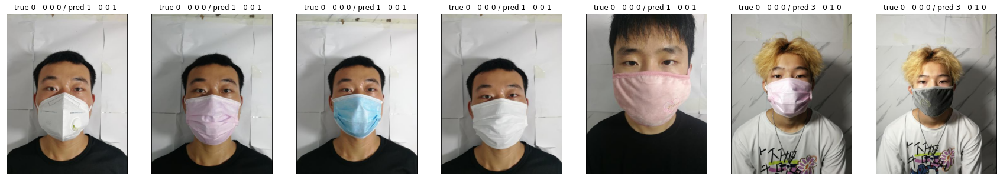

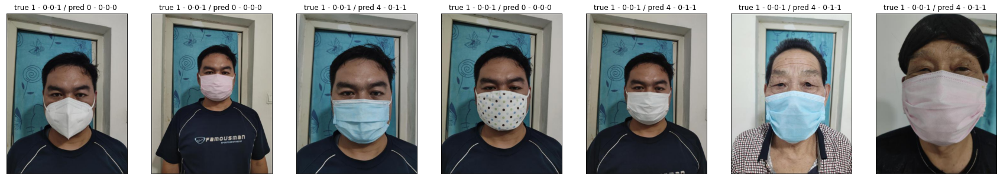

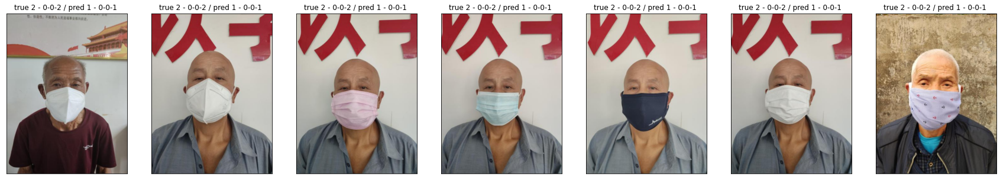

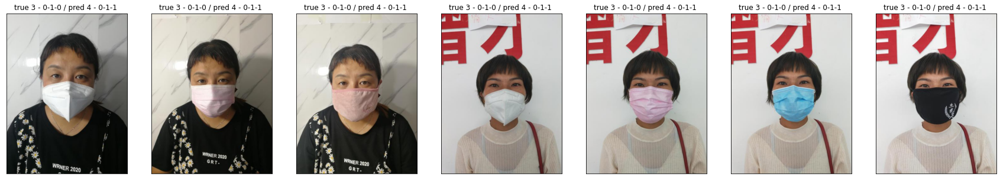

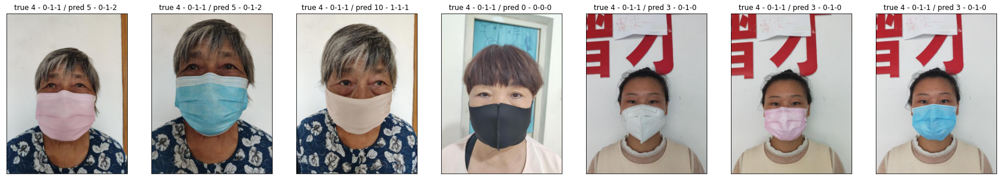

...

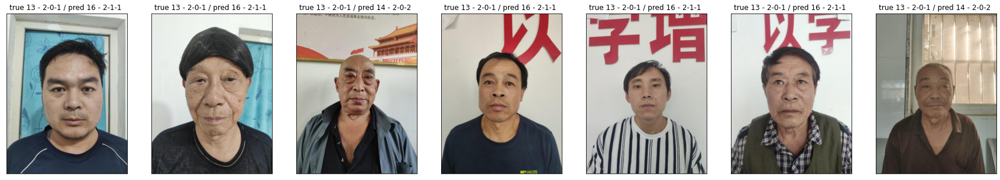

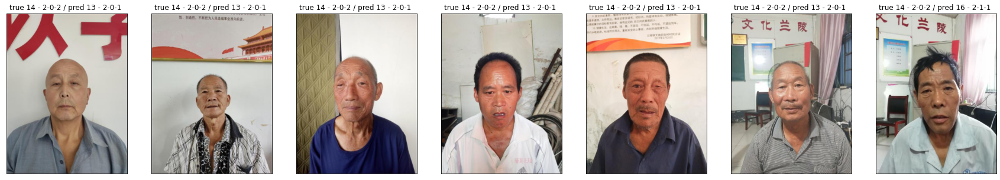

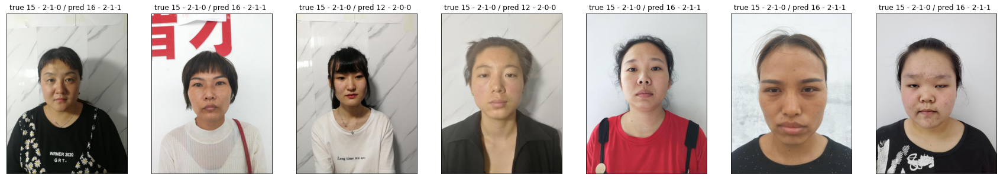

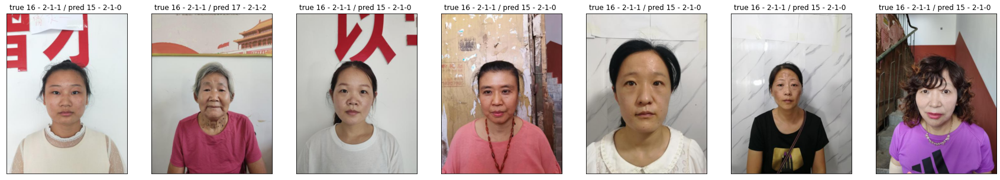

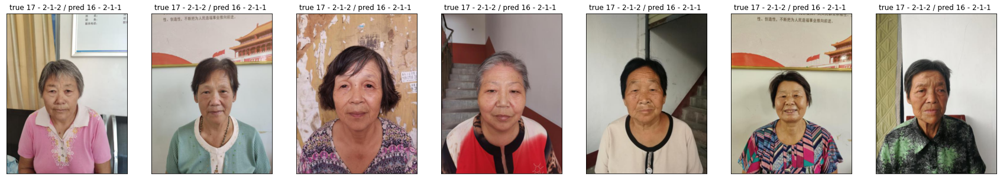

In [24]:
# labels 로 masks, genders, ages 역추적
labels2masks_genders_ages = {}
for line in train_df[~(train_df.duplicated(subset=[config.tagets_col]))].iloc:
    labels2masks_genders_ages[line[config.tagets_col]] = str(line['masks']) + '-' + str(line['genders']) + '-' + str(line['ages'])

# 틀린 이미지 시각화
image_show_df = train_df.iloc[idx_li, :].reset_index(drop =True)
image_show_df['pred_labels'] = pred_labels
false_image_show_df = image_show_df[image_show_df[config.tagets_col] != image_show_df['pred_labels']]
labels_li = [i for i in range(config.num_classes)]
for labels in labels_li:
    _false_image_show_df = false_image_show_df[false_image_show_df[config.tagets_col] == labels]
    path_labels_pred_labels_li = _false_image_show_df[['path', config.tagets_col, 'pred_labels']].values[:7]
    
    idx = 0
    fig, ax = plt.subplots(1, 7, figsize = (30, 15))
    ax = ax.flatten()
    for path_labels_pred_labels in path_labels_pred_labels_li:
        img = Image.open(path_labels_pred_labels[0])
        img = np.array(img)
        ax[idx].imshow(img)
        ax[idx].set_title(f'true {path_labels_pred_labels[1]} - {labels2masks_genders_ages[path_labels_pred_labels[1]]} / pred {path_labels_pred_labels[2]} - {labels2masks_genders_ages[path_labels_pred_labels[2]]} ')
        ax[idx].set_xticks([])
        ax[idx].set_yticks([])
        idx += 1
    plt.show()

# 저장

In [25]:
submission.to_csv(os.path.join(config.submission_dir, config.file_name), index=False)
submission.head()

,ImageID,ans
0,cbc5c6e168e63498590db46022617123f1fe1268.jpg,13
1,0e72482bf56b3581c081f7da2a6180b8792c7089.jpg,1
2,b549040c49190cedc41327748aeb197c1670f14d.jpg,13
3,4f9cb2a045c6d5b9e50ad3459ea7b791eb6e18bc.jpg,13
4,248428d9a4a5b6229a7081c32851b90cb8d38d0c.jpg,12


# 앙상블

In [20]:
pred_df = pd.DataFrame()
pred_df['masks'] = pred_labels
pred_df.to_csv(os.path.join(config.submission_dir, f'{config.timm_model_name}_masks.csv'))
pred_df.head()

,masks
0,2
1,0
2,0
3,0
4,0


In [21]:
pred_ages_df = pd.read_csv(os.path.join(config.submission_dir, f'{config.timm_model_name}_ages.csv'))
pred_genders_df = pd.read_csv(os.path.join(config.submission_dir, f'{config.timm_model_name}_genders.csv'))
pred_masks_df = pd.read_csv(os.path.join(config.submission_dir, f'{config.timm_model_name}_masks.csv'))

In [22]:
def get_labels(masks, genders, ages):
    return masks * 6 + genders * 3 + ages

pred_li = []
for masks_line, genders_line, ages_line in zip(pred_masks_df.iloc, pred_genders_df.iloc, pred_ages_df.iloc):
    pred_li.append(get_labels(masks_line['masks'], genders_line['genders'], ages_line['ages']))

pred_df = pd.DataFrame()
pred_df['labels'] = pred_li

In [23]:
real_labels = train_df.iloc[idx_li, :].reset_index(drop =True)['labels'].tolist()
pred_labels = pred_df['labels'].tolist()

In [24]:
train_f1 = get_f1_score(y_true = real_labels, y_pred = pred_labels)
train_acc = get_acc_score(y_true = real_labels, y_pred = pred_labels)
train_confusion_matrix = pd.DataFrame((confusion_matrix(y_true = real_labels, y_pred = pred_labels)))
print(f'train confusion_matrix')
display(train_confusion_matrix.style.background_gradient(cmap='YlOrRd', axis = 1))
print(f'train fi : {train_f1:.4f}, train acc: {train_acc:.4f} \n')

train confusion_matrix


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,2644,97,0,22,5,0,2,0,0,0,0,0,0,0,0,0,0,0
1,83,1791,139,5,25,4,0,1,1,0,1,0,0,0,0,0,0,0
2,0,191,222,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0
3,33,4,0,3425,181,0,0,0,0,2,0,0,0,0,0,0,0,0
4,0,22,0,113,3796,151,0,0,0,0,2,1,0,0,0,0,0,0
5,0,2,1,0,205,336,0,0,0,0,0,1,0,0,0,0,0,0
6,4,1,0,0,0,0,526,18,0,5,0,0,0,0,0,0,0,0
7,0,3,1,0,0,0,15,356,26,2,5,2,0,0,0,0,0,0
8,0,0,0,0,0,0,0,39,44,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,7,1,0,692,29,0,0,0,0,0,0,0


train fi : 0.8187, train acc: 0.9041 



In [25]:
config.submission_data_name

'info.csv'

In [27]:
submission_df = pd.read_csv(os.path.join(config.submission_dir, config.submission_data_name))
sub_ages_df = pd.read_csv(os.path.join(config.submission_dir, f'{config.timm_model_name}_ages.csv'))
sub_genders_df = pd.read_csv(os.path.join(config.submission_dir, f'{config.timm_model_name}_genders.csv'))
sub_masks_df = pd.read_csv(os.path.join(config.submission_dir, f'{config.timm_model_name}_masks.csv'))

In [29]:
def get_labels(masks, genders, ages):
    return masks * 6 + genders * 3 + ages

pred_li = []
for masks_line, genders_line, ages_line in zip(sub_masks_df.iloc, sub_genders_df.iloc, sub_ages_df.iloc):
    pred_li.append(get_labels(masks_line['ans'], genders_line['ans'], ages_line['ans']))

In [30]:
submission_df['ans'] = pred_li

In [31]:
submission_df.to_csv(os.path.join(config.submission_dir, 'ages_genders_masks_ensemble.csv'), index=False)
submission_df.head()

,ImageID,ans
0,cbc5c6e168e63498590db46022617123f1fe1268.jpg,13
1,0e72482bf56b3581c081f7da2a6180b8792c7089.jpg,1
2,b549040c49190cedc41327748aeb197c1670f14d.jpg,13
3,4f9cb2a045c6d5b9e50ad3459ea7b791eb6e18bc.jpg,13
4,248428d9a4a5b6229a7081c32851b90cb8d38d0c.jpg,12
